# Miscelaneus routines implementations
A collection of simple routines to be used in Jupyter Notebooks

# Select_file: simple file selector

In [1]:
import os
def select_file(start="."):
    """
    Crude implementation of a file selector.
    Navigates through the folders, while interacting with the user, until a file is selected.
    Depends on:
    import os
    Parameters:
    start: If not given, assumes "." (current folder)
    Returns the full name of the selected file
    """
    current_dir = os.path.abspath(start)
    if not os.path.isdir(current_dir):
        raise ValueError("Starting point must be a readable folder")
    current_folder_content = [".."] + os.listdir(current_dir)
    navigate = True
    while navigate:
        print("Current folder: {}".format(current_dir))
        print("Content: {}".format(current_folder_content))
        text = input("Which file ? ")
        if text in current_folder_content:
            to_open = os.path.join(current_dir, text)
            if os.path.isdir(to_open):
                if text == "..":
                    current_dir = os.path.join("/", *current_dir.split("/")[1:-1])
                else: 
                    current_dir = os.path.join(current_dir, text)
                current_folder_content = [".."] + os.listdir(current_dir)
            else:
                to_open = os.path.join(current_dir, text)
                navigate = False
        else:
            print("File {} not found".format(text))
    return to_open

## Usage example

In [2]:
select_file("README.md")

ValueError: Starting point must be a readable folder

In [3]:
my_file = select_file(".")
print("\nThat's the file I'm looking for: {}".format(my_file))

Current folder: /media/stelling/OS/xampp/htdocs/notebooks
Content: ['..', '.git', '.ipynb_checkpoints', 'data', 'Miscelaneus.ipynb', 'README.md', 'Sandbox.ipynb']
Which file ? README
File README not found
Current folder: /media/stelling/OS/xampp/htdocs/notebooks
Content: ['..', '.git', '.ipynb_checkpoints', 'data', 'Miscelaneus.ipynb', 'README.md', 'Sandbox.ipynb']
Which file ? README.md

That's the file I'm looking for: /media/stelling/OS/xampp/htdocs/notebooks/README.md


In [4]:
my_file

'/media/stelling/OS/xampp/htdocs/notebooks/README.md'

# Visualization examples

## Bokeh and Holoviews - Imports

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
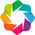

In [5]:
from bokeh.io import output_notebook, show
from bokeh.models import BasicTicker, ColorBar, ColumnDataSource, LinearColorMapper, PrintfTickFormatter, HoverTool
from bokeh.plotting import figure
from bokeh.sampledata.unemployment1948 import data as us_unemployment
from bokeh.transform import transform

import os
import holoviews as hv
import numpy as np
import pandas as pd
from holoviews import opts
import colorcet as cc
hv.extension('bokeh')

## Time series, line plot

In [6]:
def ts_line(df,
            date='Date',
            y="y",
            title="Line plot",
            color='steelblue',
            toolbar='right',
            dash_color=None,
            width=900,
            height=400):
    """
    Simple bokeh time series line chart
    Input:
    df: Time series dataframe
    date: Name of the date field
    y: Name of the y field
    title: Title for the plot
    color: Color for the plot, defaults to 'steelblue'
    toolbar: Toolbar location
    dash_color: Color for the dash, defaults to None (no dash)
    width: Plot width
    height: Plot height
    Output:
    A line plot
    Returns the plot object
    """
    if not isinstance(df[date][0], pd.Timestamp):
        raise ValueError("Need a datetime field")
    if y is None:
        raise ValueError("Need data to plot on the y axis")
    elif y not in df.keys():
        raise ValueError("Invalid data to plot on the y axis: {}".format(y))

    # Prepares the datasource
    source = ColumnDataSource(df)

    # and draws a simple line plot
    plot = figure(x_axis_type='datetime',
                  title=title,
                  toolbar_location=toolbar,
                  plot_width=width,
                  plot_height=height)
    plot.dash(x=date, y=y, source=source, line_color=dash_color)
    plot.line(x=date, y=y, source=source, color=color)

    hover = HoverTool(
        tooltips = [
            ("Dia", "@{"+date+"}{%d/%m/%Y}"),
            ("Nascimentos", "@{"+y+"}")
        ],
        formatters =  {
            date: 'datetime', # use 'datetime' formatter for 'date' field
        }
    )
    
    plot.add_tools(hover)
    show(plot)
    return plot

## Time series, area plot

In [7]:
def ts_area(df,
            date='Date',
            y="y",
            title="Area plot",
            color='steelblue',
            toolbar='right',
            alpha=0.5,
            width=900,
            height=400):
    """
    Simple bokeh time series area chart
    Input:
    df: Time series dataframe
    date: Name of the date field
    y: Name of the y field
    title: Plot title
    color: Color for the plot, defaults to 'steelblue'
    toolbar: Toolbar location
    alpha: Alpha of the plot color, defaults to 0.5
    width: Plot width
    height: Plot height

    Output:
    An area plot
    Returns the plot object
    """
    # Makes sure date field is a datetime
    # WARNING: Changes the original dataframe!!!
    if not isinstance(df[date][0], pd.Timestamp):
        df[date] = pd.to_datetime(df[date])
    
    # Fills the two corners for the patch
    df_start = pd.DataFrame(dict([(date, [df[date].iloc[0]]),  (y, [0])]))
    df_end   = pd.DataFrame(dict([(date, [df[date].iloc[-1]]), (y, [0])]))
    dfpatch = df_start.append(df, sort=False).append(df_end, sort=False)
    
    # Prepares the datasource
    source = ColumnDataSource(dfpatch)
    # And draws an area plot using patch
    plot = figure(x_axis_type='datetime',
                  title=title,
                  toolbar_location=toolbar,
                  plot_width=width,
                  plot_height=height)
    plot.patch(x=date, y=y, source=source, color=color, alpha=alpha)
    show(plot)
    return plot

### Usage

In [8]:
# Data from: https://datamarket.com/data/set/235k/daily-total-female-births-in-california-1959#!ds=235k&display=line
output_notebook()
# Reads the csv into a DataFrame
df = pd.read_csv(os.path.join("data", "daily-total-female-births-in-cal.csv"))
# Gets summary from last record
summary = df.iloc[-1]
# and drops the summary from the dataframe
df = df.drop([len(df)-1])

# Gets key names, dfKey[0] is a date column, dfKey[1] is the data column
df_keys = df.keys()
df[df_keys[0]] = pd.to_datetime(df[df_keys[0]])

ts_line(df, date=df_keys[0], y=df_keys[1], title='Line plot without dashes')
ts_line(df, date=df_keys[0], y=df_keys[1], title='Line plot with dashes', dash_color='steelblue')
ts_area(df, date=df_keys[0], y=df_keys[1], title='Area graph')

Loading BokehJS ...

Figure(id='1397', ...)

## Holoviews heatmap with dataframe

In [9]:
def heat_map(df, fields=None, width=800, height=600, plot=True,
             title='Heatmap', tools=['hover'], toolbar=None,
             cmap='Blues', xaxis=None, yaxis=None,
             **kwargs):
    """
    Holoviews heatmap implementation.
    Depends on:
    import holoviews as hv
    from holoviews import opts
    
    hv.extension('bokeh')
    
    Input:
    df: A dataframe
    Optional:
    fields: List of fields to be used on the heatmap ([x, y, values])
    width: Width of the heatmap
    height: Height of the heatmap
    plot: Will only plot if plot is True
    title: Title of the heatmap
    tools: List of tools for the heatmap, defaults to Hover functionality
    toolbar: Toolbar location, defaults to None
    cmap: Color mapping, defaults to Blues (bokeh)
    xaxis: xaxis label location, defaults to None
    yaxis: yaxis label location, defaults to None
    **kwargs: Additional options to be forwarded to hv.opts
    
    Output:
    a heatmap
    Returns the heatmap object
    """

    if not isinstance(df, pd.DataFrame):
        print("First parameter must be a datafreame")
        raise ValueError
    if fields is not None:
        if not isinstance(fields, list):
            print("List of fields is not a list")
            raise ValueError
        datafields = list(df.keys())
        for value in fields:
            if not value in datafields:
                print("Field {} not in dataframe".format(value))
                raise ValueError
        heatmap = hv.HeatMap(df[fields])
    else:
        heatmap = hv.HeatMap(df)
    if plot:
        heatmap.opts(opts.HeatMap(tools=tools,
                                title=title,
                                xaxis=xaxis,
                                yaxis=yaxis,
                                colorbar=True,
                                width=width,
                                height=height,
                                toolbar=toolbar,
                                cmap=cmap,
                                **kwargs))
    return heatmap

### Usage example

In [12]:
x = 300
y = 300
num_data = pd.DataFrame([(i, j) for i in range(x) for j in range(y)], columns=['x', 'y'])

num_data['sum'] = num_data['x']+num_data['y']
num_data['diff'] = num_data['x']-num_data['y']
num_data['mod'] = num_data['x'] % num_data['y']
num_data['product'] = num_data['x']*num_data['y']
np.random.seed(42)
num_data['random'] = np.random.rand(len(num_data))
num_data['random_normal'] = np.random.normal(5, 5, len(num_data))
num_data.tail()

,x,y,sum,diff,mod,product,random,random_normal
89995,299,295,594,4,4.0,88205,0.911559,4.117409
89996,299,296,595,3,3.0,88504,0.041505,5.598083
89997,299,297,596,2,2.0,88803,0.143737,9.852127
89998,299,298,597,1,1.0,89102,0.255729,2.948004
89999,299,299,598,0,0.0,89401,0.927797,4.221266


In [13]:
heat_map(num_data, fields=["x", "y", "random"])

:HeatMap   [x,y]   (random)

In [14]:
heat_map(num_data, width=525, height=500, cmap="binary")

:HeatMap   [x,y]   (sum,diff,mod,product,random,random_normal)

## Holoview raster

In [86]:
def raster(raster_data, width=800, height=600, plot=True,
             title='Raster', tools=['hover'], toolbar=None,
             cmap='Blues', xaxis='bottom', yaxis='left',
             **kwargs):
    """
    Holoviews raster implementation.
    Depends on:
    import holoviews as hv
    from holoviews import opts
    
    hv.extension('bokeh')
    
    Input:
    raster_data: A MxN list/numpy array
    Optional:
    width: Width of the heatmap
    height: Height of the heatmap
    plot: Will only plot if plot is True
    title: Title of the raster
    tools: List of tools for the heatmap, defaults to Hover functionality
    toolbar: Toolbar location, defaults to None
    cmap: Color mapping, defaults to Blues (bokeh)
    xaxis: xaxis label location, defaults to None
    yaxis: yaxis label location, defaults to None
    **kwargs: Additional options to be forwarded to hv.opts
    
    Output:
    a heatmap
    Returns the heatmap object
    """

    raster_plot = hv.Raster(raster_data)
    
    if plot:
        raster_plot.opts(opts.Raster(tools=tools,
                                title=title,
                                xaxis=xaxis,
                                yaxis=yaxis,
                                colorbar=True,
                                width=width,
                                height=height,
                                toolbar=toolbar,
                                cmap=cmap,
                                **kwargs))
    
    return raster_plot

In [87]:
#raster_data = np.random.rand(300*300)
dimension = 300
raster(np.reshape([i*j for i in range(dimension) for j in range(dimension)], (300,300)),
       cmap='rainbow',
       title='Plot of x*y',
       invert_yaxis=True, width=550, height=500)

:Raster   [x,y]   (z)

In [88]:
raster(np.random.rand(500, 500), cmap='binary', invert_yaxis=True)

:Raster   [x,y]   (z)

In [83]:
xvals = np.linspace(0,4,202)
ys,xs = np.meshgrid(xvals, -xvals[::-1])
raster_data = np.sin(((ys)**3)*xs)
raster(raster_data, cmap='fire', width=870, height=800, invert_yaxis=True)

:Raster   [x,y]   (z)